In [2]:
import numpy as np
np.random.seed(123)
#import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time
from sklearn.metrics import f1_score, precision_score, recall_score, roc_auc_score
from changepoynt.algorithms.sst import SST
from changepoynt.algorithms.rulsif import RuLSIF
from changepoynt.algorithms.floss import FLOSS
from changepoynt.algorithms.esst import ESST
from changepoynt.algorithms.clasp import CLASP
%matplotlib inline

In [8]:
# some plotting utilities
def plot_data_and_score(raw_data, trueChanges, cutoffScore, score):
    predictedChanges = np.zeros(len(score))
    for item in range(len(score)):
        if score[item]<= cutoffScore:
            predictedChanges[item] = 0
        else:
            predictedChanges[item] = 1
    
    # roc_auc_score(trueChanges[0:len(predictedChanges)], predictedChanges, average="binary")
    # f1 = f1_score(trueChanges[0:len(predictedChanges)], predictedChanges)
    # print(f1)
    
    # precision = precision_score(trueChanges[0:len(predictedChanges)],  predictedChanges, average="binary")
    # print(precision)
    
    # recall = recall_score(trueChanges[0:len(predictedChanges)],  predictedChanges, average="binary")
    # print(recall)
    f, ax = plt.subplots(2,1,figsize=(20,10))
    ax[0].plot(raw_data); ax[0].set_title("time series")
    ax[1].plot(score,"r"); ax[1].set_title("change score")
    x_grid, y_grid = np.meshgrid(np.arange(len(score)),np.linspace(*ax[0].get_ylim()))
    z_grid = (score/np.max(score))[x_grid]
    ax[0].contourf(x_grid, y_grid, z_grid,alpha=0.5, cmap="BuPu")

In [7]:
# the methods in this file are not published algorithms but reference methods for sanity checking evaluation metrics
# and benchmark signals. If these methods reach high performance, either the benchmark data is relatively "easy" to
# solve or the metrics used for performance evaluation are not suitable.
#
# With this we want to follow an argument made for Time Series Anomaly Detection and sanity check whether a new method
# really is progress. See the following line from a very interesting paper:
# "However, as we will show, much of the results of this complex approach can be duplicated with a single line
# of code and a few minutes of effort."
# in "Current Time Series Anomaly Detection Benchmarks are Flawed and are Creating the Illusion of Progress"
# Renjie Wu and Eamonn J. Keogh
# IEEE TRANSACTIONS ON KNOWLEDGE AND DATA ENGINEERING
# 2023
#
# The ZERO method is also used as a baseline method in:
# "An Evaluation of Change Point Detection Algorithms"
# Gerrit J. J. van den Burg and Christopher K. I. Williams
# arXiv preprint arXiv:2003.06222, 2020
import numpy as np

from changepoynt.algorithms.base_algorithm import Algorithm


class ZERO(Algorithm):
    """
    This class implements the ZERO baseline algorithm.

    "An Evaluation of Change Point Detection Algorithms"
    Gerrit J. J. van den Burg and Christopher K. I. Williams
    arXiv preprint arXiv:2003.06222, 2020
    """

    def __init__(self) -> None:
        super().__init__()

    def fit(self, time_series: np.ndarray) -> None:
        pass

    def transform(self, time_series: np.ndarray) -> np.ndarray:
        return np.zeros_like(time_series)


class MovingWindow(Algorithm):
    """
    This class implements moving window algorithms that are as simple as possible for sanity checking.

    This class implements a similar ideas as in:
    Current Time Series Anomaly Detection Benchmarks are Flawed and are Creating the Illusion of Progress
    Renjie Wu and Eamonn J. Keogh
    IEEE TRANSACTIONS ON KNOWLEDGE AND DATA ENGINEERING
    2023
    """

    def __init__(self, window_length: int, method: str = 'mean') -> None:
        super().__init__()

        # define the possible methods
        possible_methods = {"mean", "var", "meanvar"}

        # save the input parameters
        self.__fit = False
        assert window_length > 0, 'Window length must be greater than zero.'
        self.window_length = window_length
        assert method in possible_methods, f'Method must be one of the following: {possible_methods}.'
        self.method = method


    def fit(self, time_series: np.ndarray) -> None:
        """
        Check for the properties of the input.
        :param time_series:
        :return:
        """
        # check the dimensions of the input array
        assert time_series.ndim == 1, "Time series needs to be an 1D array."

        # check that we have at least two windows
        assert time_series.shape[0] > 2*self.window_length, 'Time series needs to be longer than 2x window length.'

        self.__fit = True

    def transform(self, time_series: np.ndarray) -> np.ndarray:
        if not self.__fit:
            self.fit(time_series)

        # use numpy tricks to create the sliding window
        sliding_window = np.lib.stride_tricks.sliding_window_view(time_series, self.window_length)
        sliding_window_var = np.var(sliding_window, axis=-1)
        sliding_window_mean = np.mean(sliding_window, axis=-1)

        # create a time series for the scores
        score = np.zeros_like(time_series)
        if self.method.startswith('mean'):
            score[self.window_length:-self.window_length+1] += np.abs(sliding_window_mean[:-self.window_length]
                                                                      - sliding_window_mean[self.window_length:])
        if self.method.endswith('var'):
            score[self.window_length:-self.window_length+1] += np.abs(sliding_window_var[:-self.window_length]
                                                                      - sliding_window_var[self.window_length:])
        return score

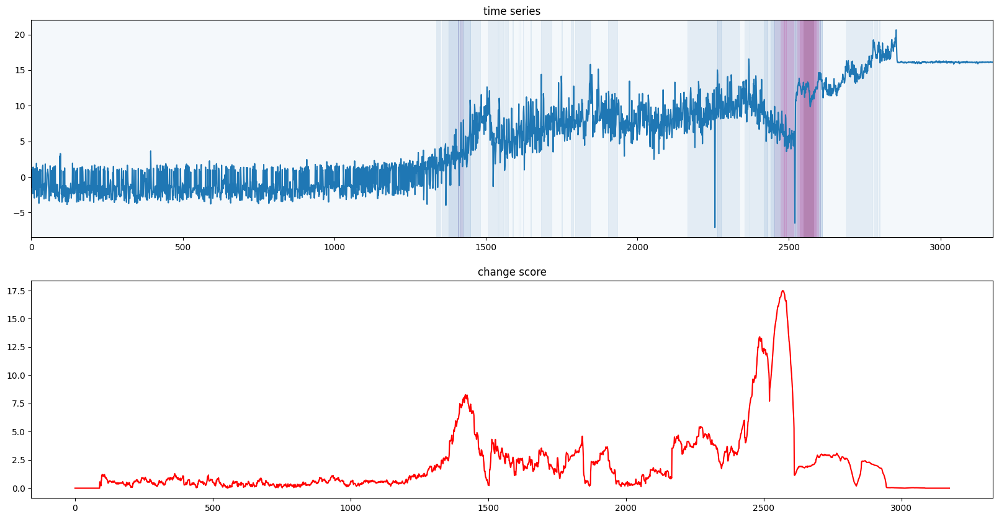

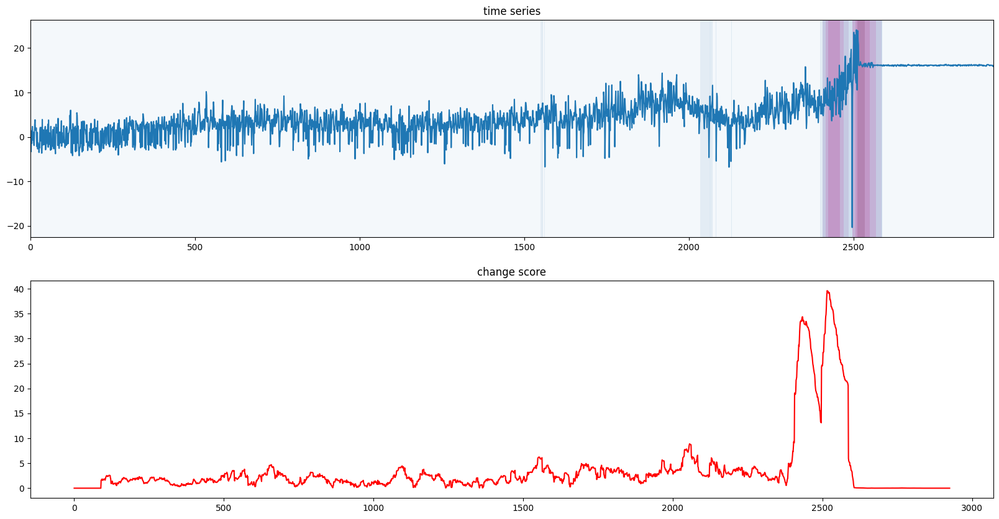

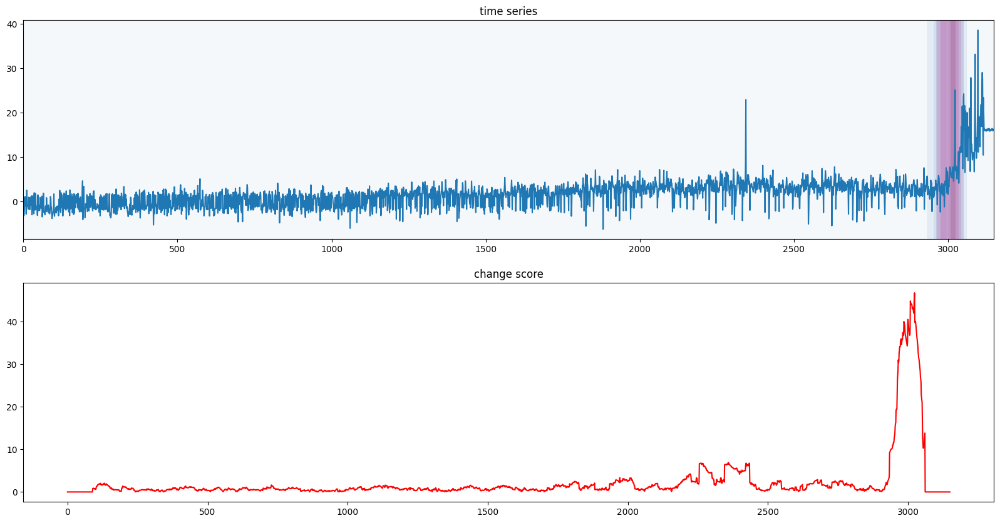

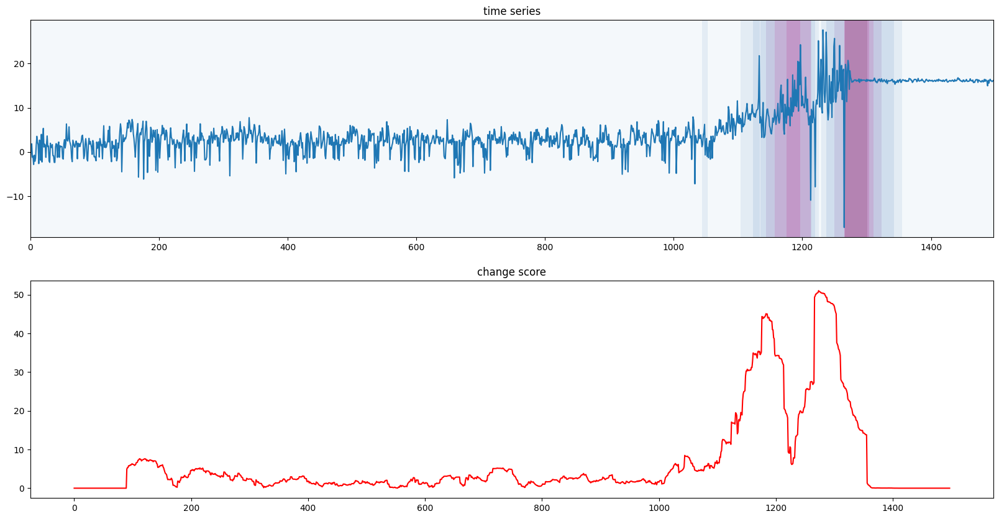

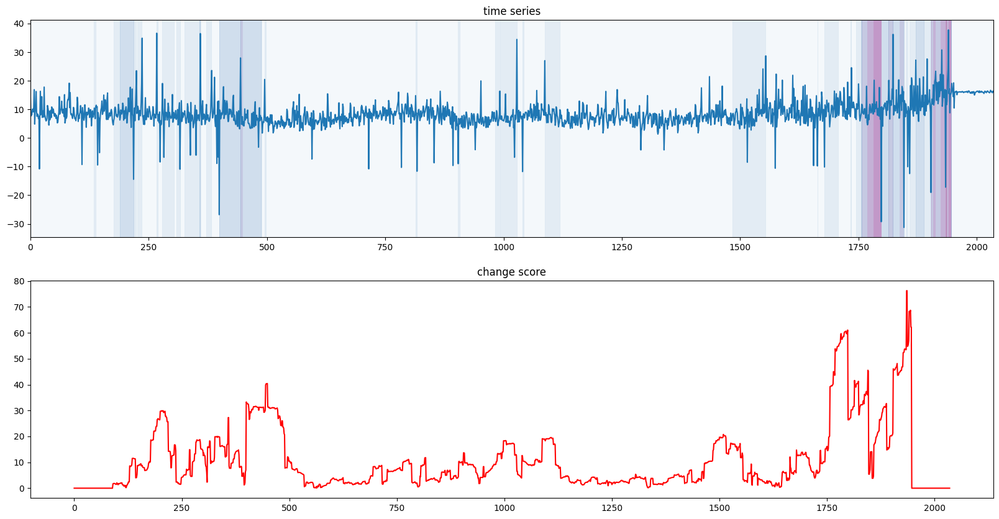

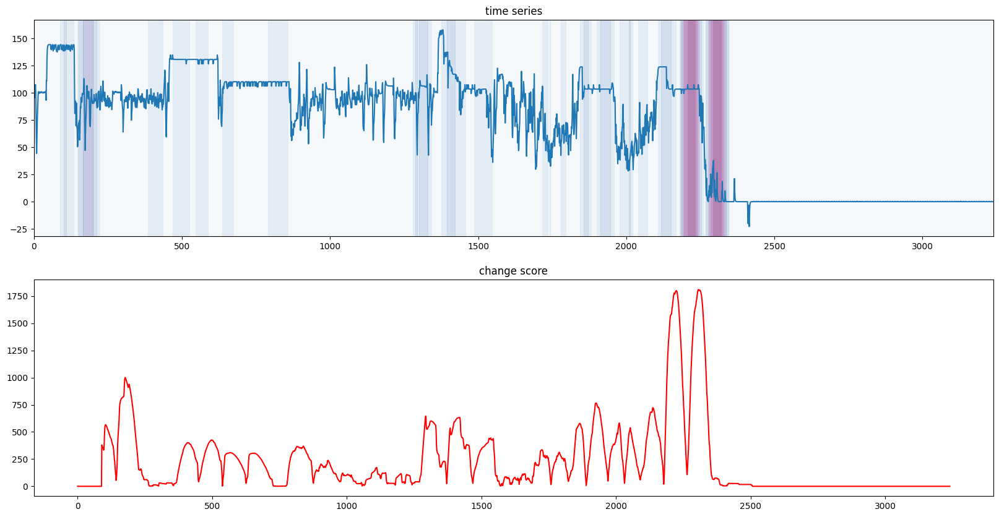

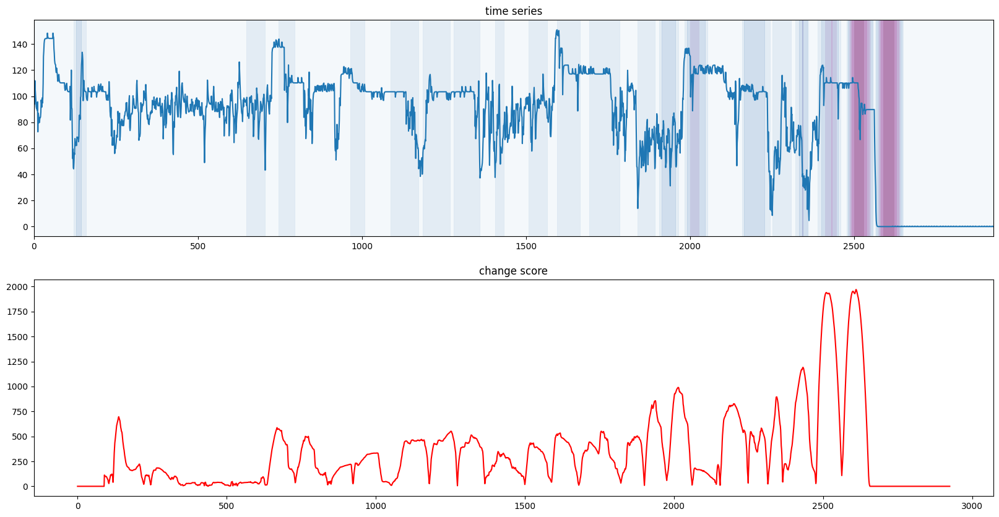

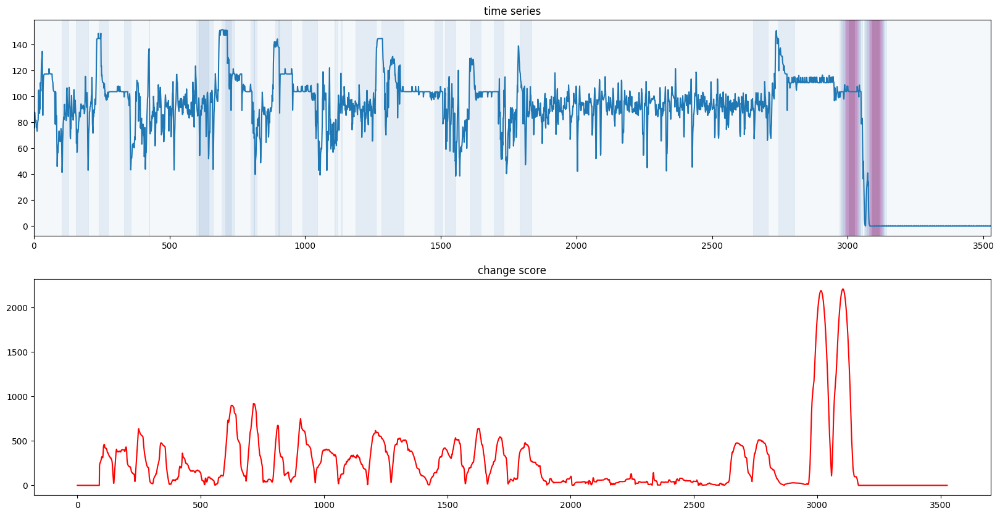

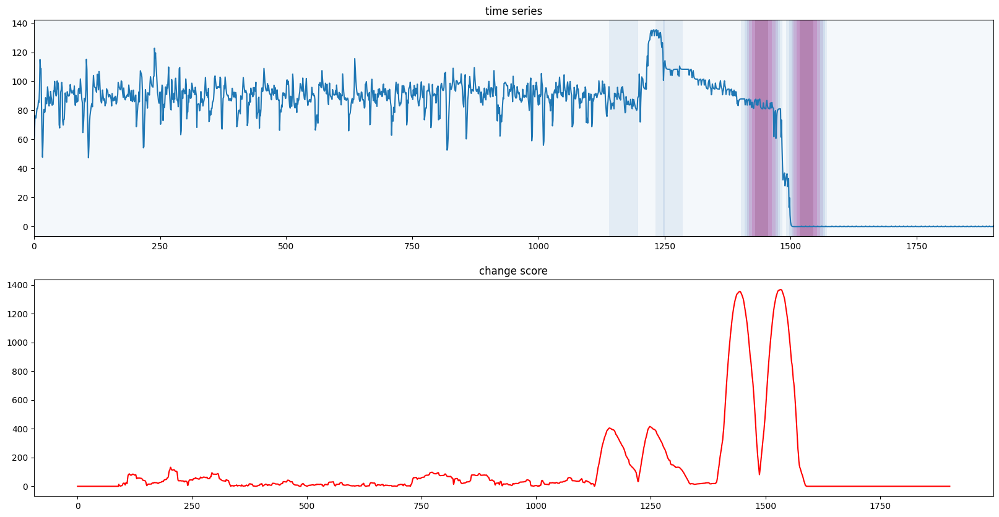

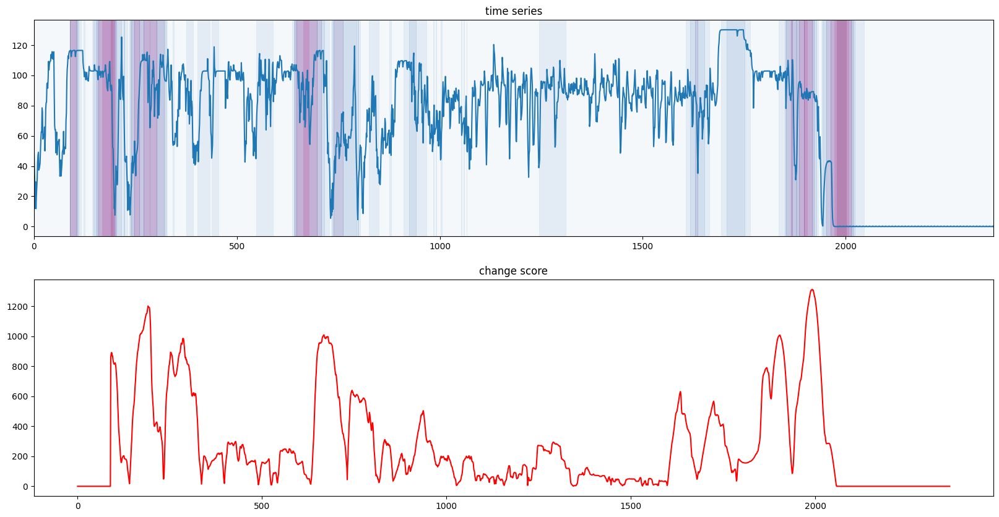

In [10]:
# MeanVar
cuttoff = 0
val = 90

#Torque

score1 = MovingWindow(val, method="meanvar").transform(x1)
score2 = MovingWindow(val, method="meanvar").transform(x2)
score3 = MovingWindow(val, method="meanvar").transform(x3)
score4 = MovingWindow(val, method="meanvar").transform(x4)
score5 = MovingWindow(val, method="meanvar").transform(x5)

score6 = MovingWindow(val, method="meanvar").transform(x6)
score7 = MovingWindow(val, method="meanvar").transform(x7)
score8 = MovingWindow(val, method="meanvar").transform(x8)
score9 = MovingWindow(val, method="meanvar").transform(x9)
score10 = MovingWindow(val, method="meanvar").transform(x10)


plot_data_and_score(x1, y1, cuttoff, score1)
plot_data_and_score(x2, y2, cuttoff, score2)
plot_data_and_score(x3, y3, cuttoff, score3)
plot_data_and_score(x4, y4, cuttoff, score4)
plot_data_and_score(x5, y5, cuttoff, score5)
plot_data_and_score(x6,y6, cuttoff,score6)
plot_data_and_score(x7,y7,cuttoff,score7)
plot_data_and_score(x8,y8,cuttoff,score8)
plot_data_and_score(x9,y9,cuttoff,score9)
plot_data_and_score(x10,y10,cuttoff,score10)


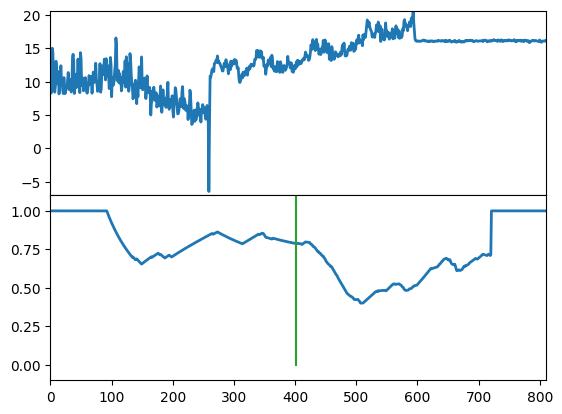

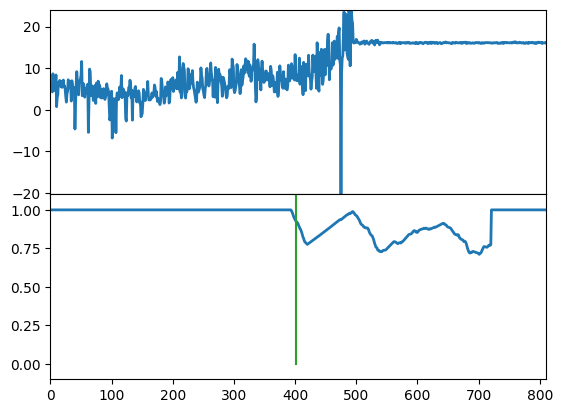

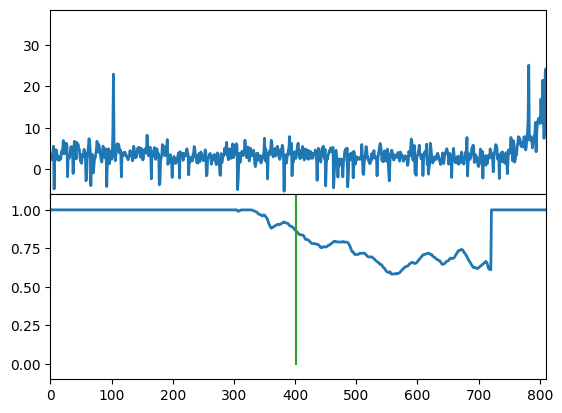

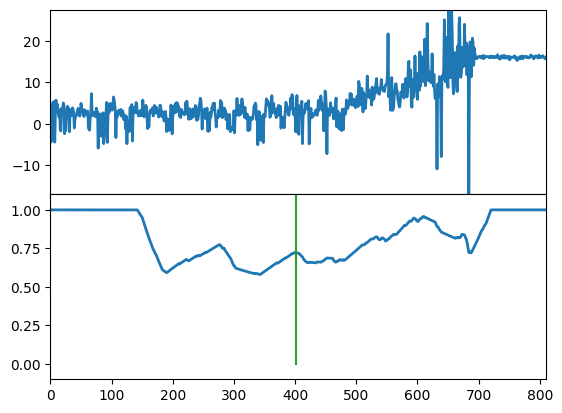

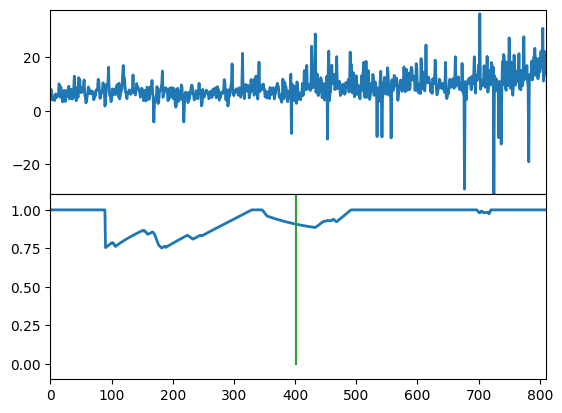

...

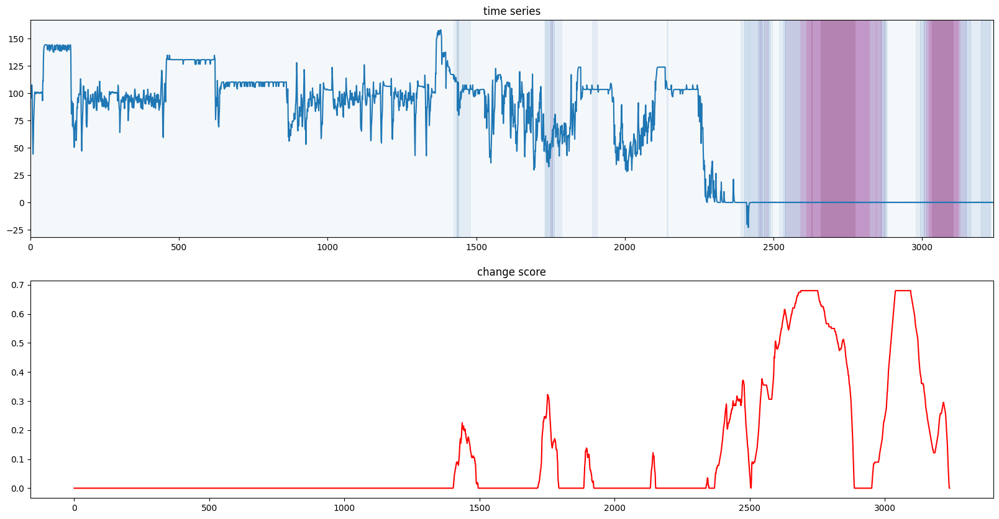

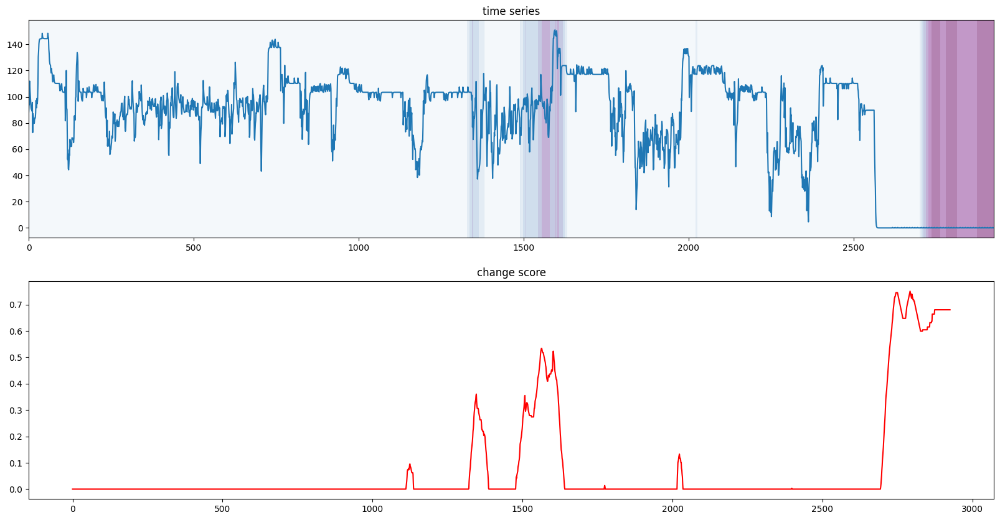

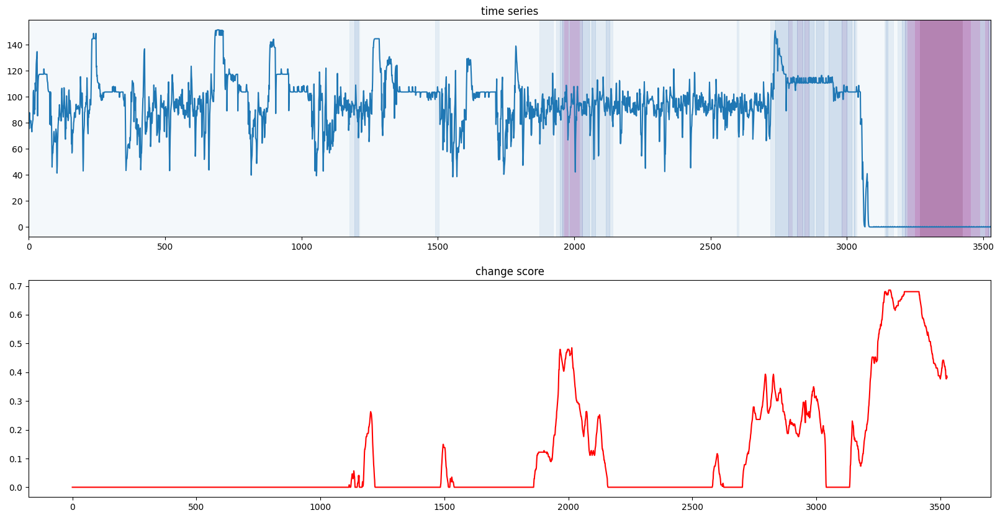

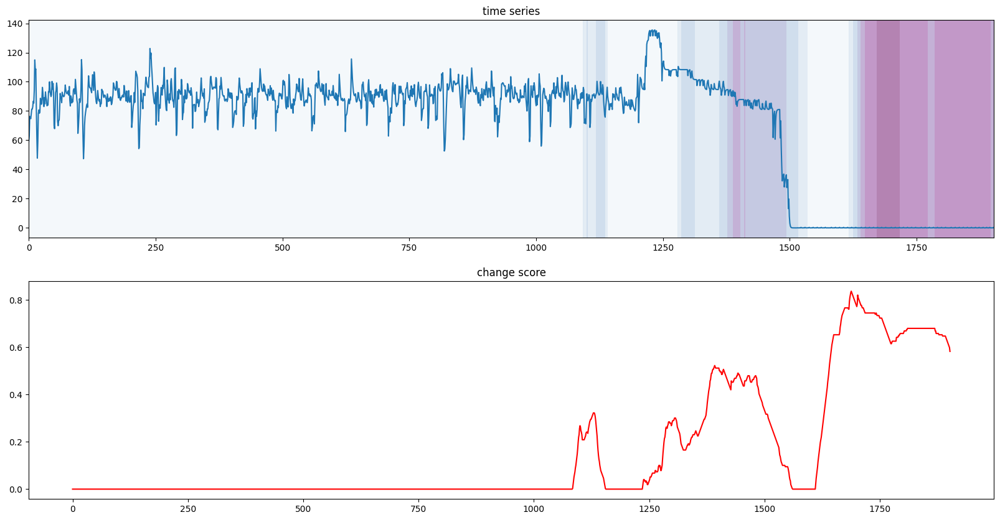

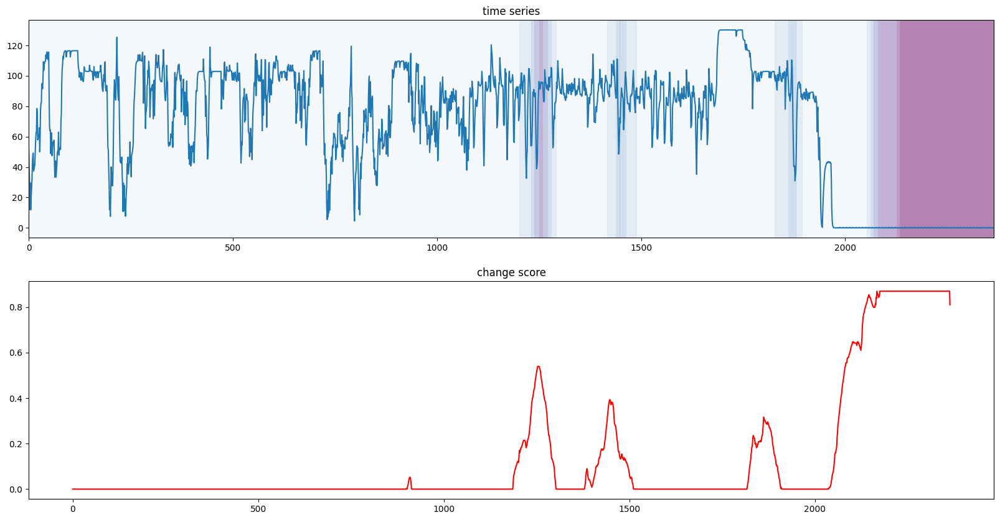

In [9]:
# compute change score using FLOSS

detector = FLOSS(window_length=90)
cuttoff = 0

# # Torque
score1 = detector.transform(x1)
score2 = detector.transform(x2)
score3 = detector.transform(x3)
score4 = detector.transform(x4)
score5 = detector.transform(x5)

# # WOB
score6 = detector.transform(x6)
score7 = detector.transform(x7)
score8 = detector.transform(x8)
score9 = detector.transform(x9)
score10 = detector.transform(x10)

# Torque
plot_data_and_score(x1, y1, cuttoff, score1)
plot_data_and_score(x2, y2, cuttoff, score2)
plot_data_and_score(x3, y3, cuttoff, score3)
plot_data_and_score(x4, y4, cuttoff, score4)
plot_data_and_score(x5, y5, cuttoff, score5)

# # WOB
plot_data_and_score(x6,y6, cuttoff,score6)
plot_data_and_score(x7,y7,cuttoff,score7)
plot_data_and_score(x8,y8,cuttoff,score8)
plot_data_and_score(x9,y9,cuttoff,score9)
plot_data_and_score(x10,y10,cuttoff,score10)



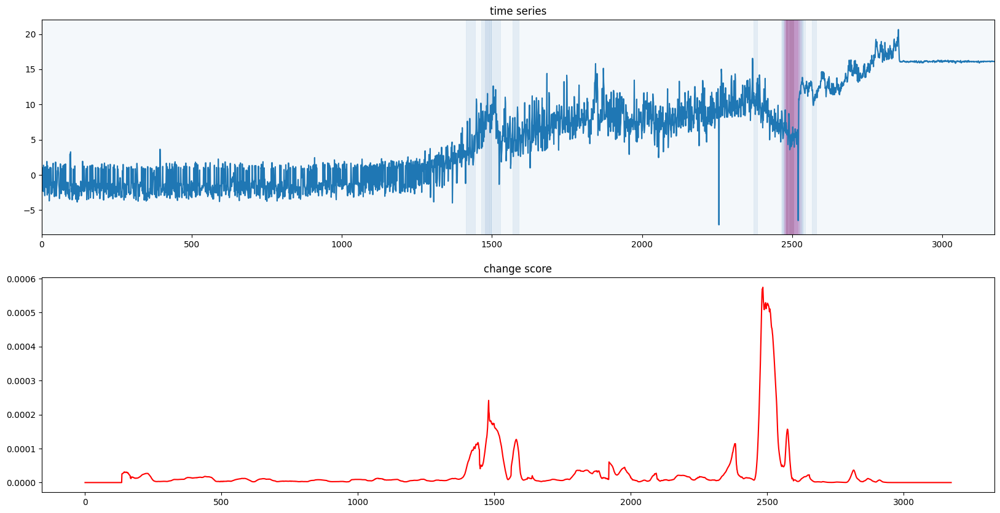

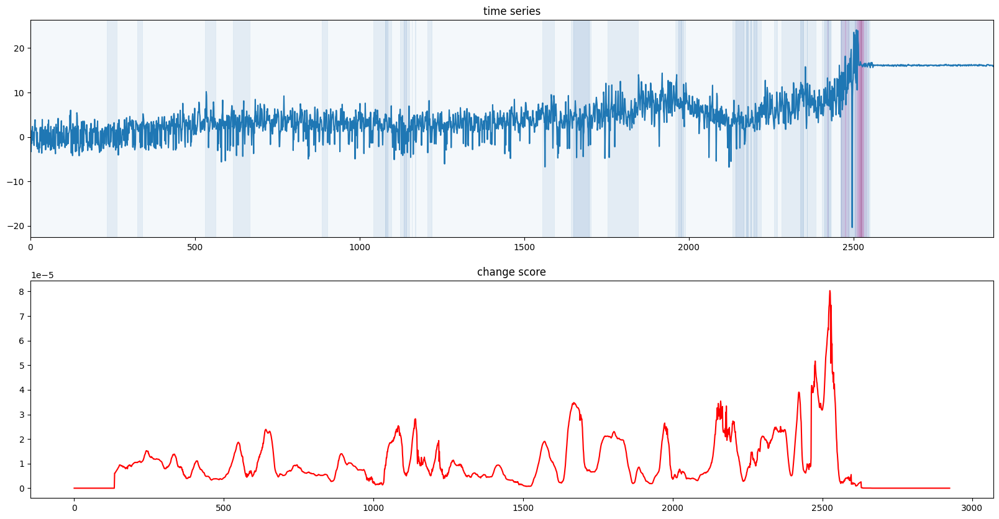

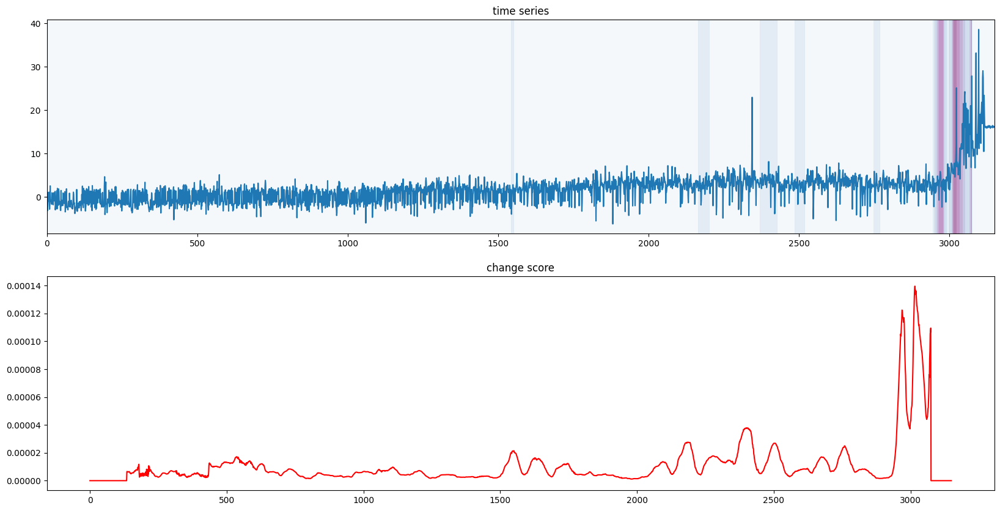

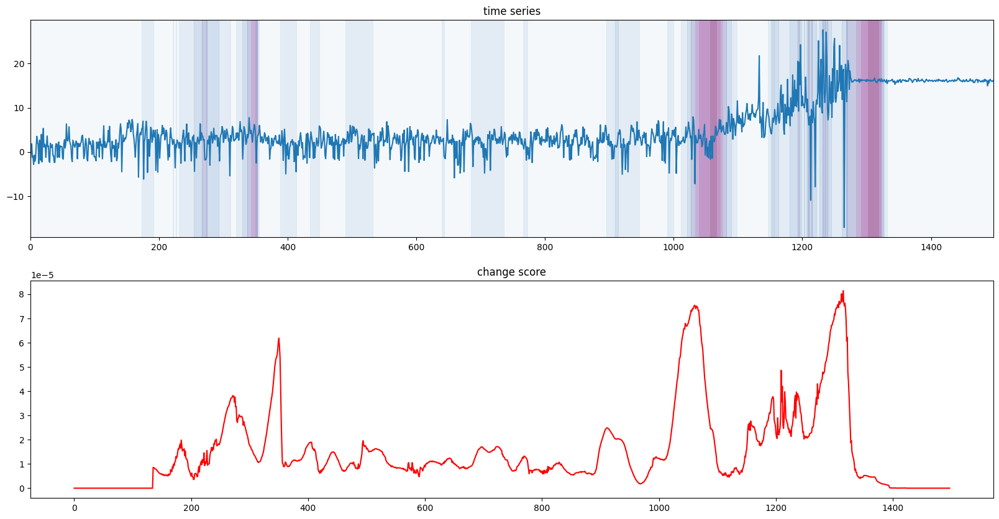

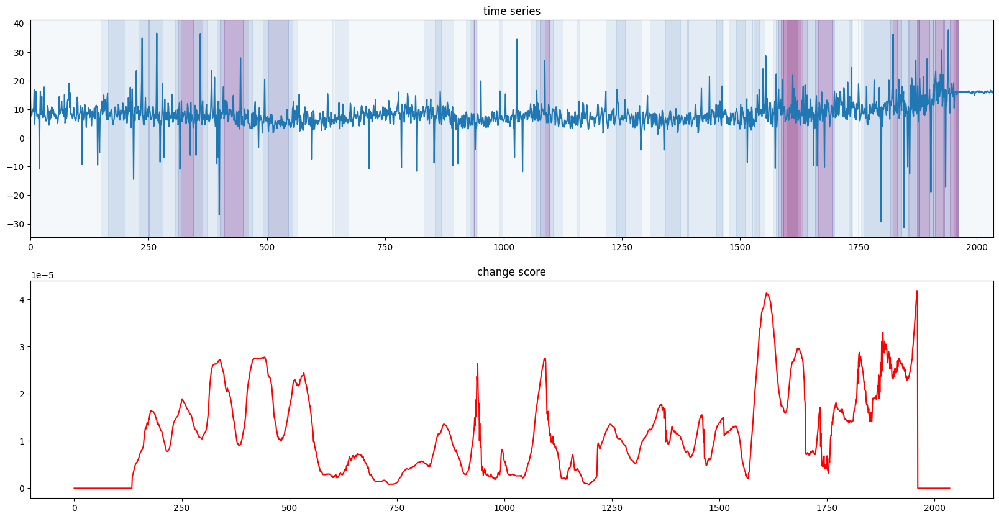

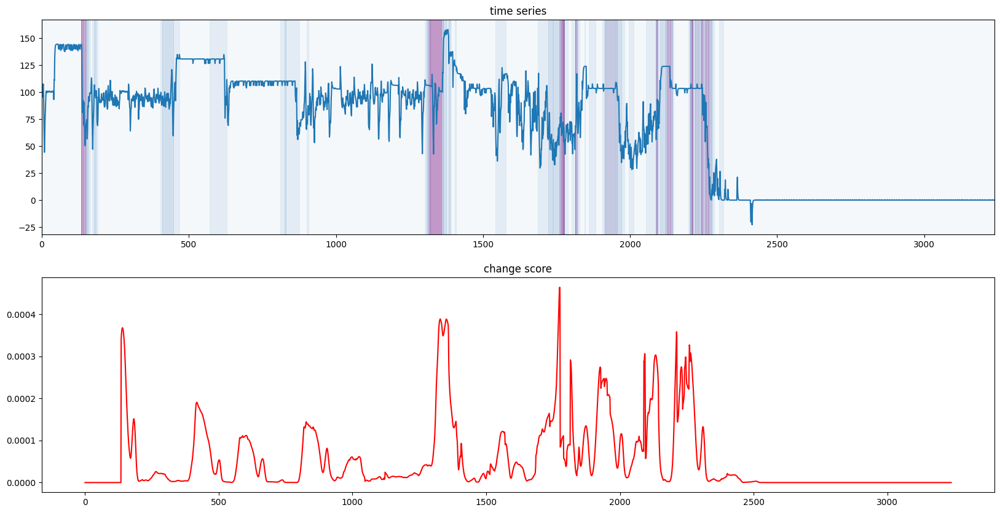

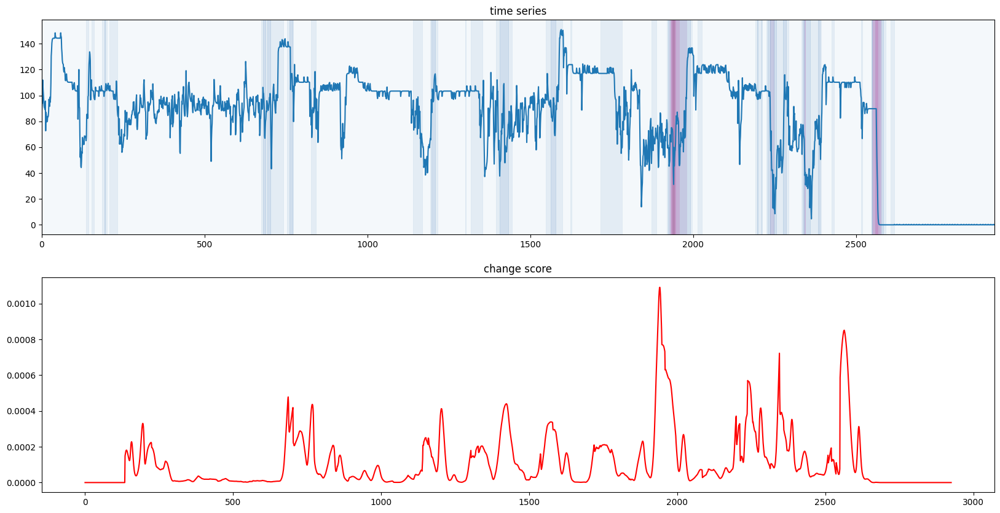

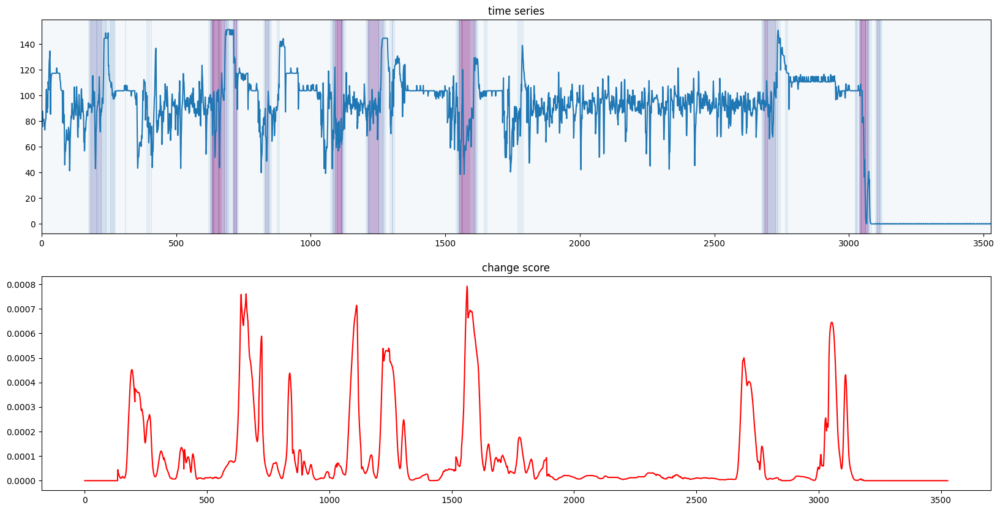

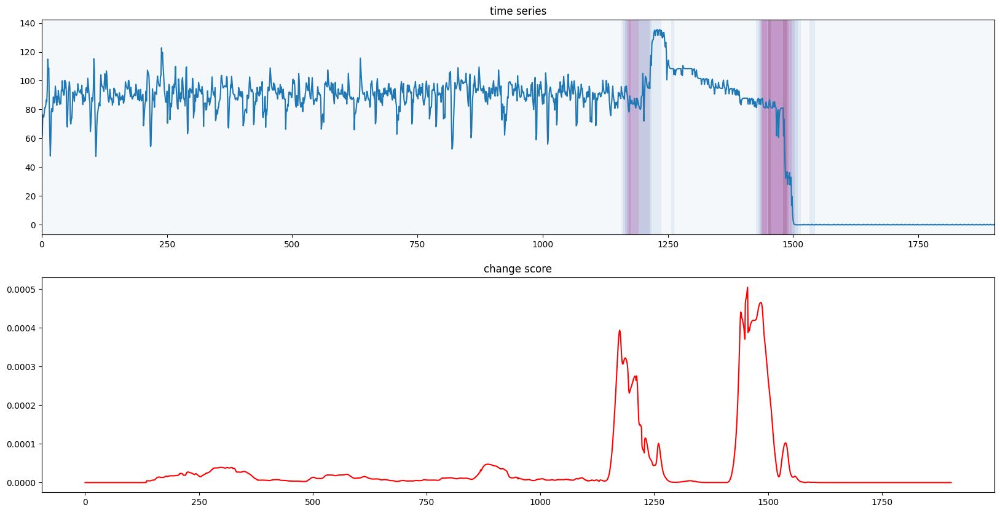

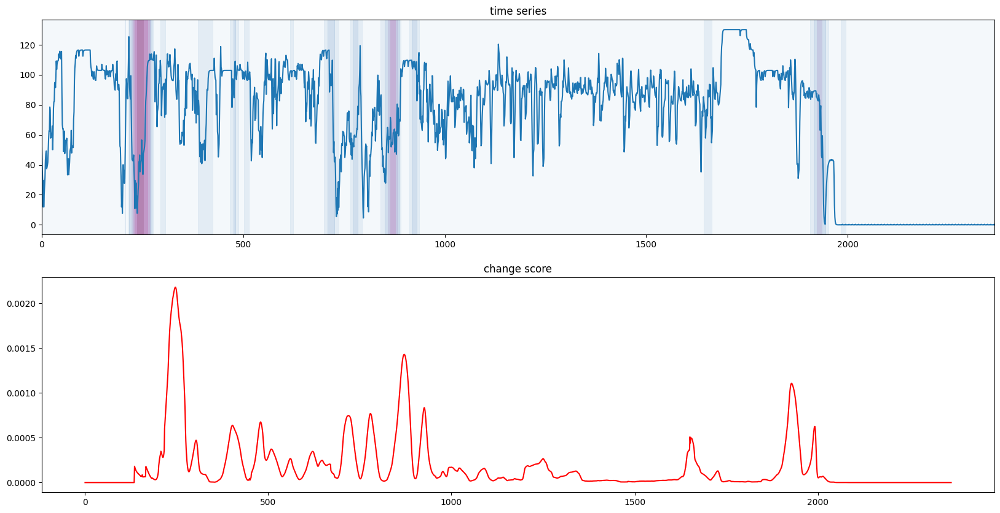

In [18]:
# compute change score using sst
detector = SST(window_length=90, rank=5, method='fbrsvd')
cuttoff = 0
# # Torque
score1 = detector.transform(x1)
score2 = detector.transform(x2)
score3 = detector.transform(x3)
score4 = detector.transform(x4)
score5 = detector.transform(x5)

# # WOB
score6 = detector.transform(x6)
score7 = detector.transform(x7)
score8 = detector.transform(x8)
score9 = detector.transform(x9)
score10 = detector.transform(x10)

# # Torque
plot_data_and_score(x1, y1, cuttoff, score1)
plot_data_and_score(x2, y2, cuttoff, score2)
plot_data_and_score(x3, y3, cuttoff, score3)
plot_data_and_score(x4, y4, cuttoff, score4)
plot_data_and_score(x5, y5, cuttoff, score5)


plot_data_and_score(x6,y6, cuttoff,score6)
plot_data_and_score(x7,y7,cuttoff,score7)
plot_data_and_score(x8,y8,cuttoff,score8)
plot_data_and_score(x9,y9,cuttoff,score9)
plot_data_and_score(x10,y10,cuttoff,score10)




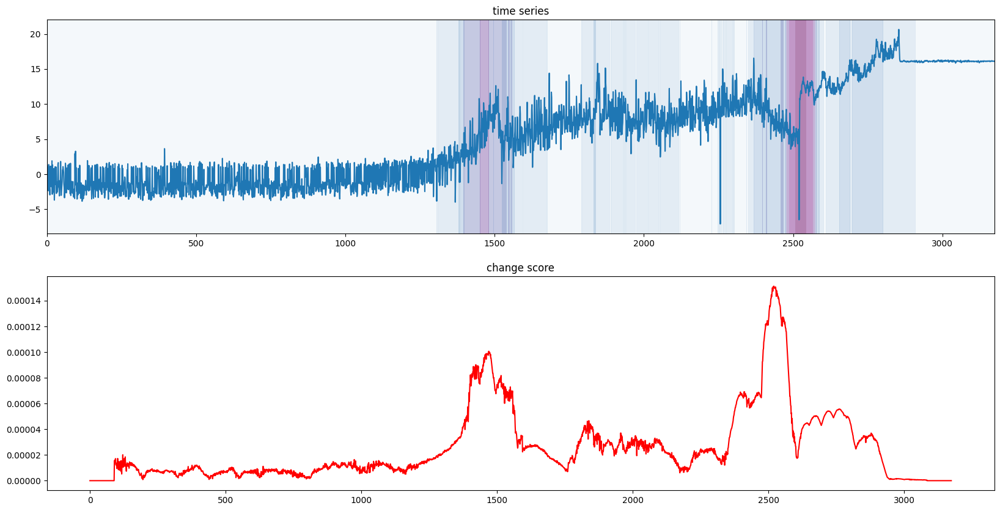

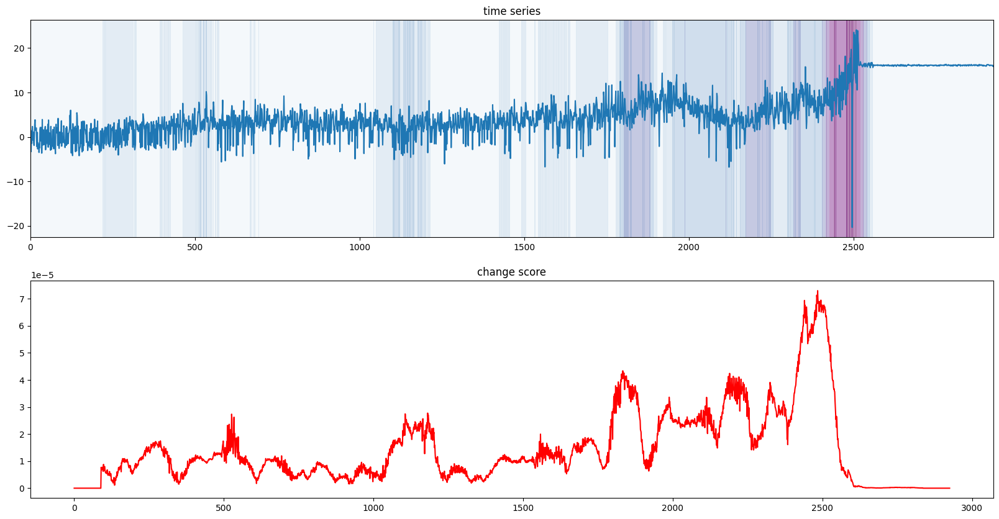

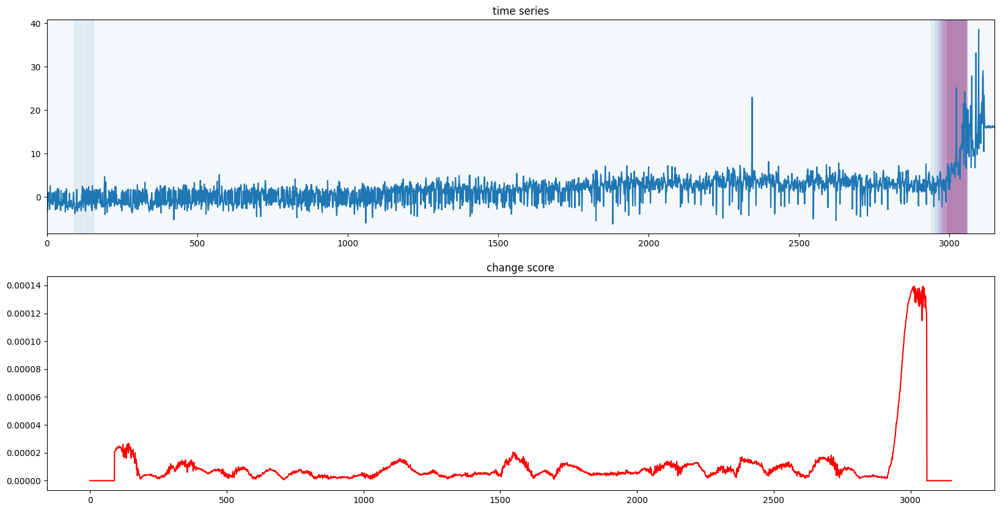

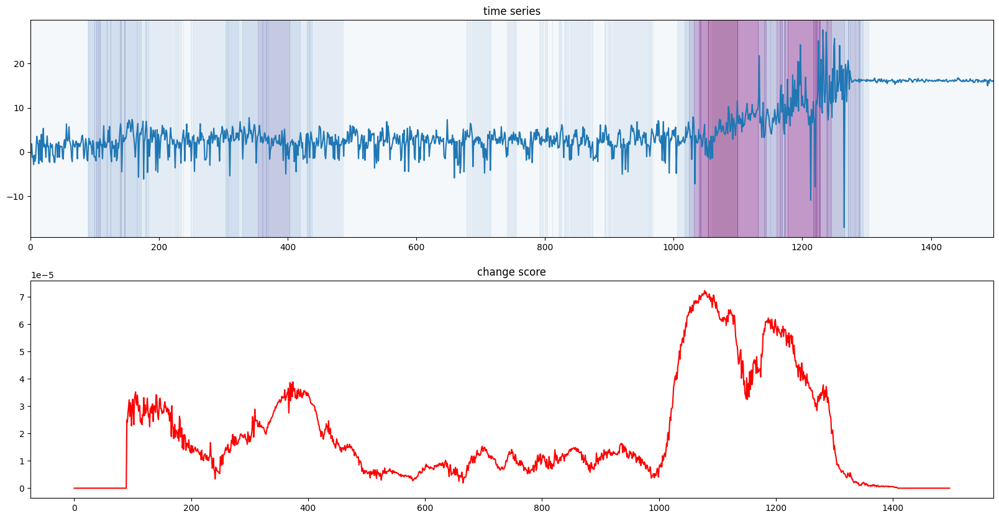

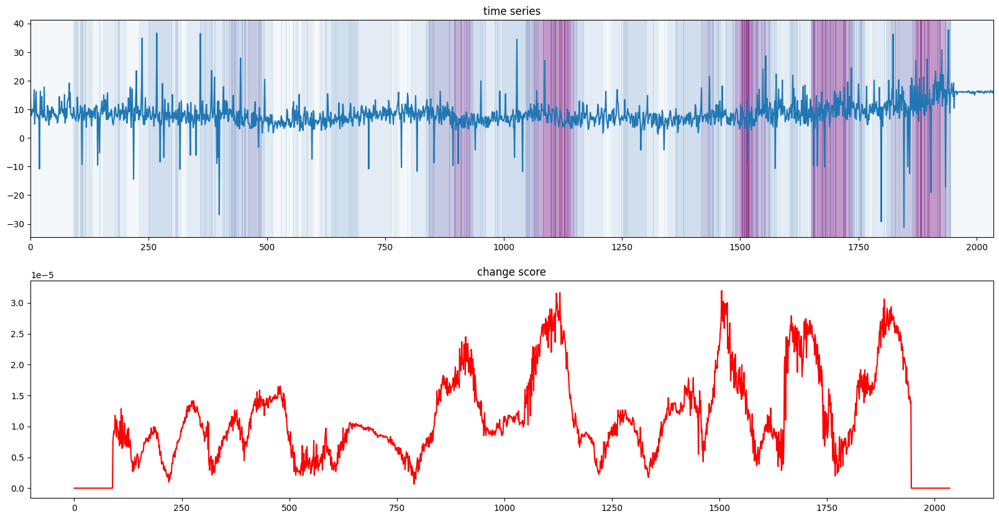

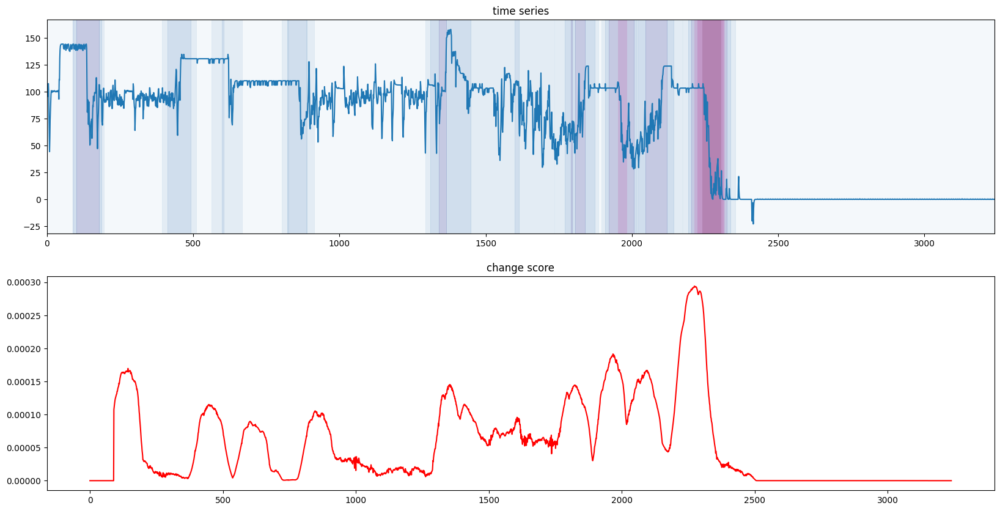

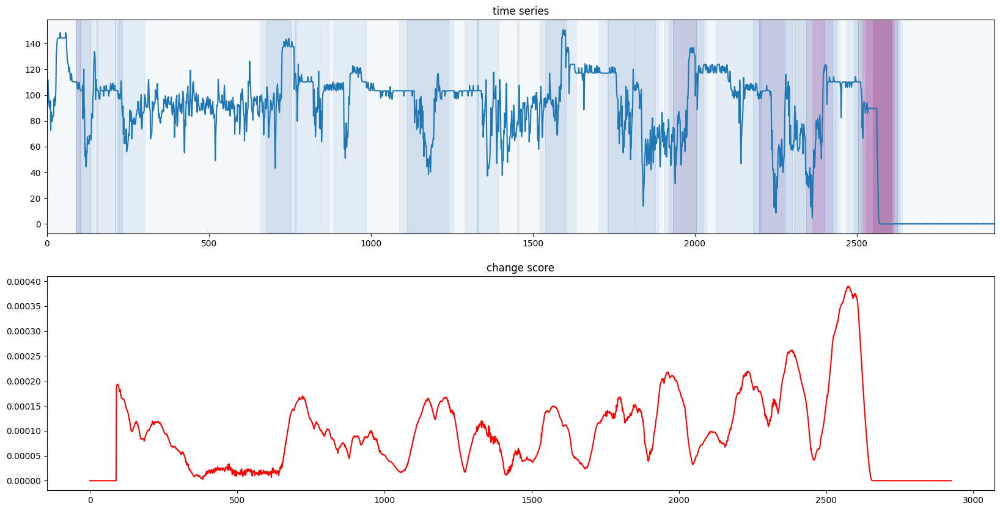

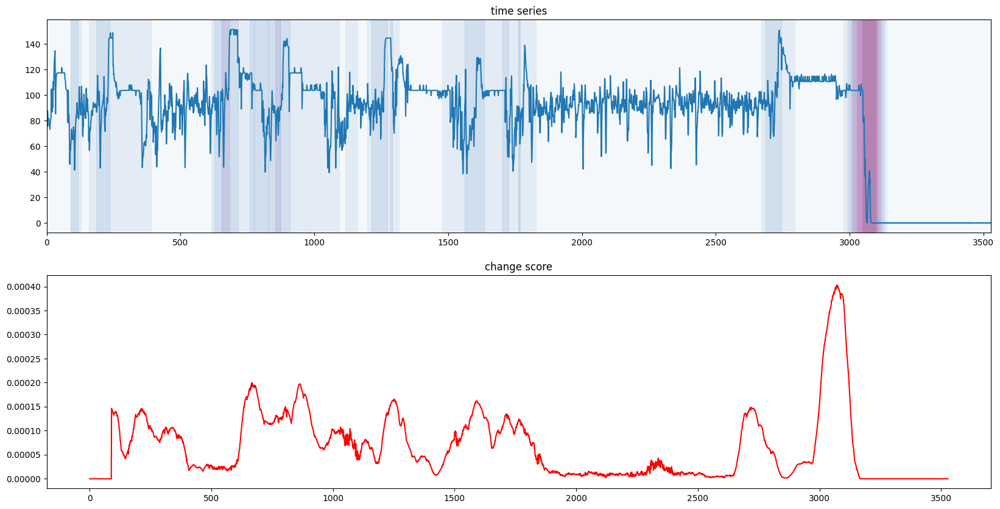

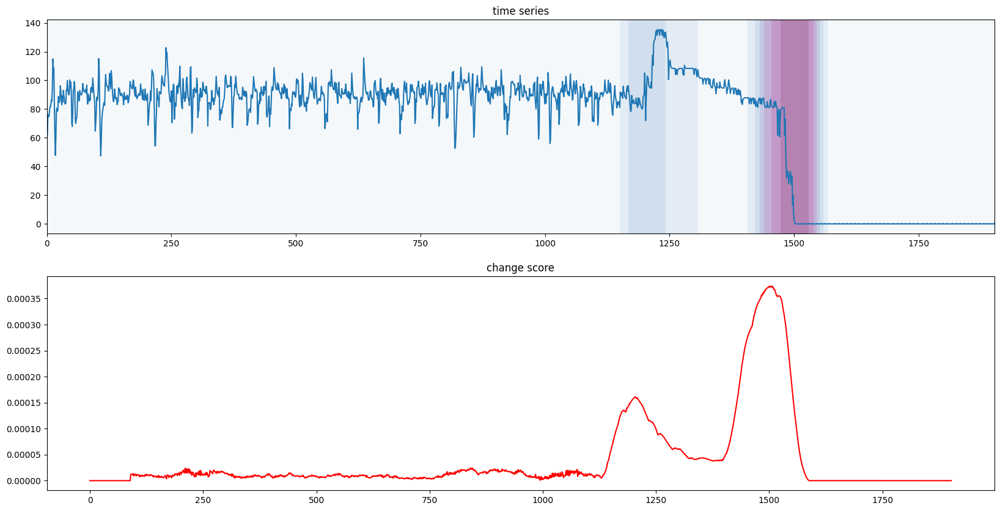

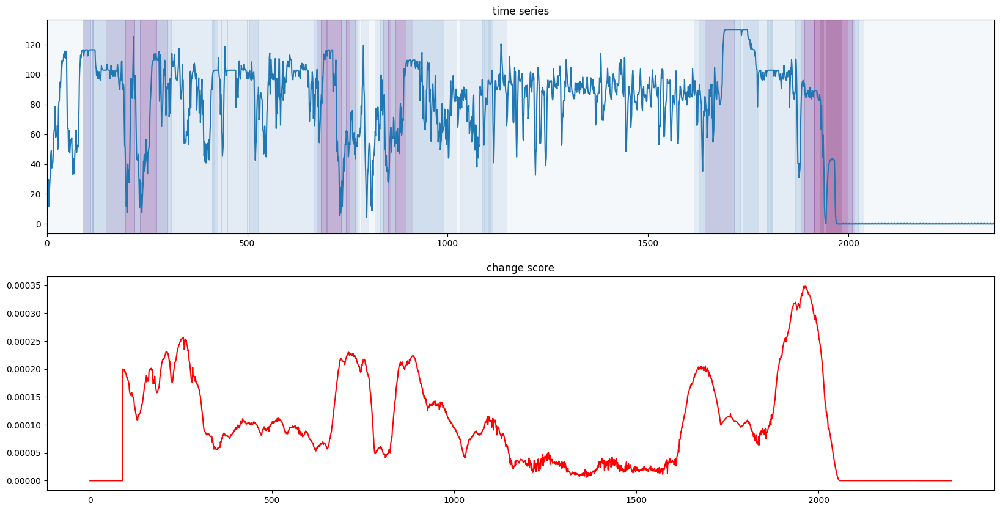

In [19]:
# compute change score using ESST
detector = ESST(90)
# Torque

score1 = detector.transform(x1)
score2 = detector.transform(x2)
score3 = detector.transform(x3)
score4 = detector.transform(x4)
score5 = detector.transform(x5)

# WOB
score6 = detector.transform(x6)
score7 = detector.transform(x7)
score8 = detector.transform(x8)
score9 = detector.transform(x9)
score10 = detector.transform(x10)

# Torque
plot_data_and_score(x1, y1, cuttoff, score1)
plot_data_and_score(x2, y2, cuttoff, score2)
plot_data_and_score(x3, y3, cuttoff, score3)
plot_data_and_score(x4, y4, cuttoff, score4)
plot_data_and_score(x5, y5, cuttoff, score5)

# # WOB
plot_data_and_score(x6,y6, cuttoff,score6)
plot_data_and_score(x7,y7,cuttoff,score7)
plot_data_and_score(x8,y8,cuttoff,score8)
plot_data_and_score(x9,y9,cuttoff,score9)
plot_data_and_score(x10,y10,cuttoff,score10)

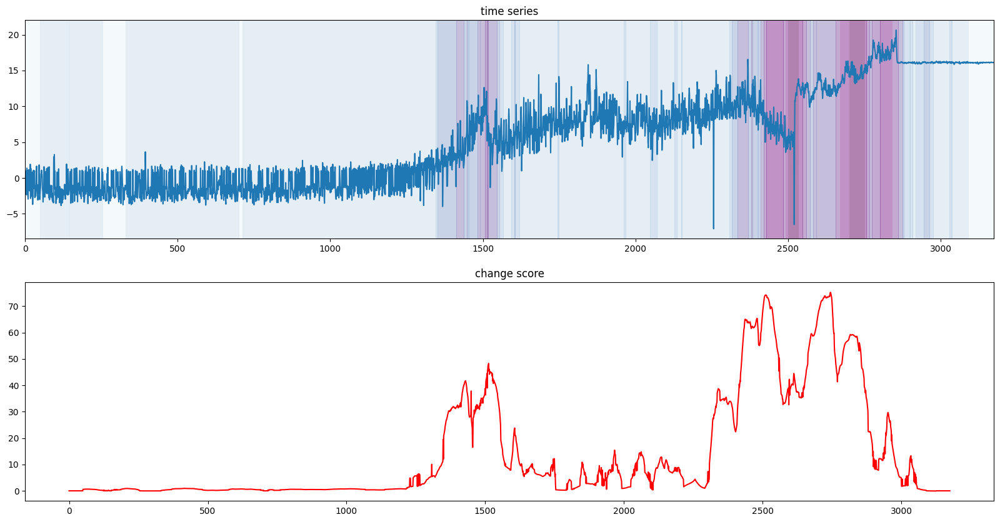

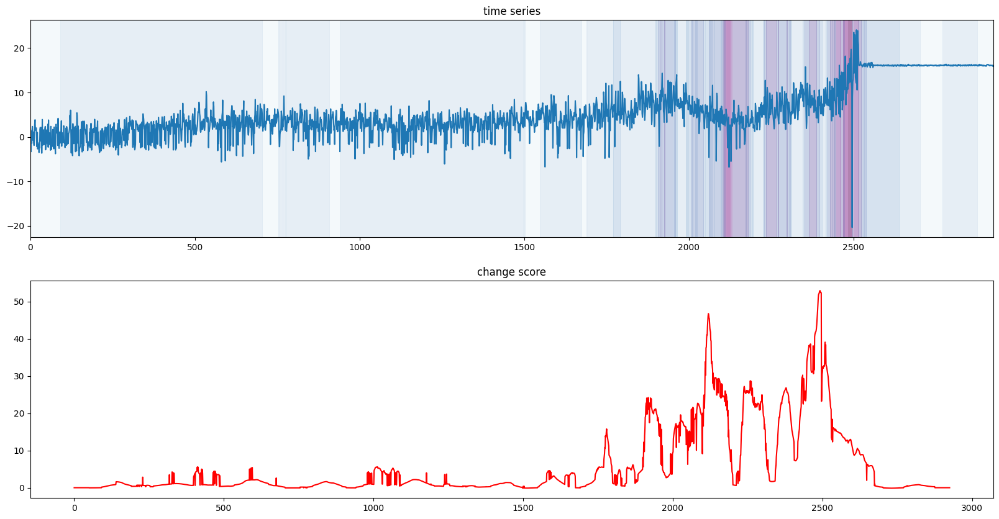

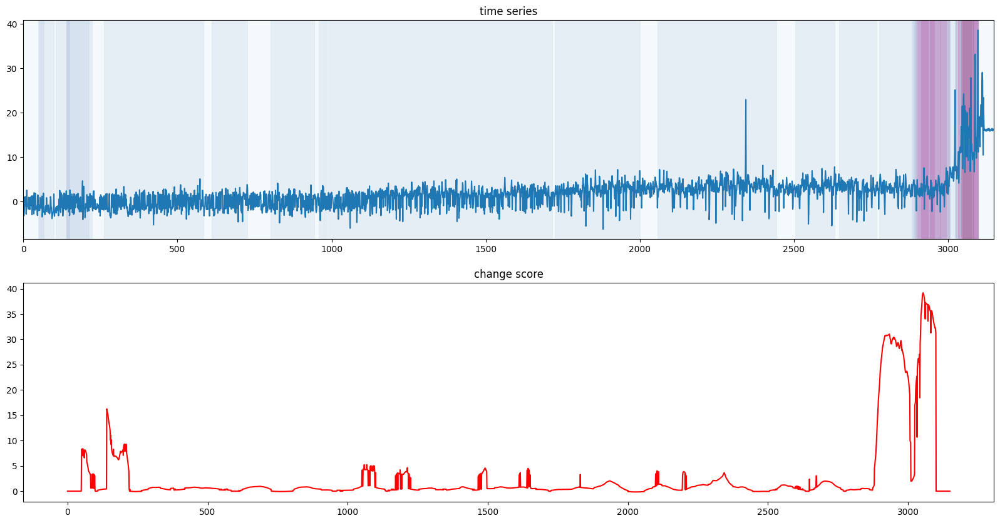

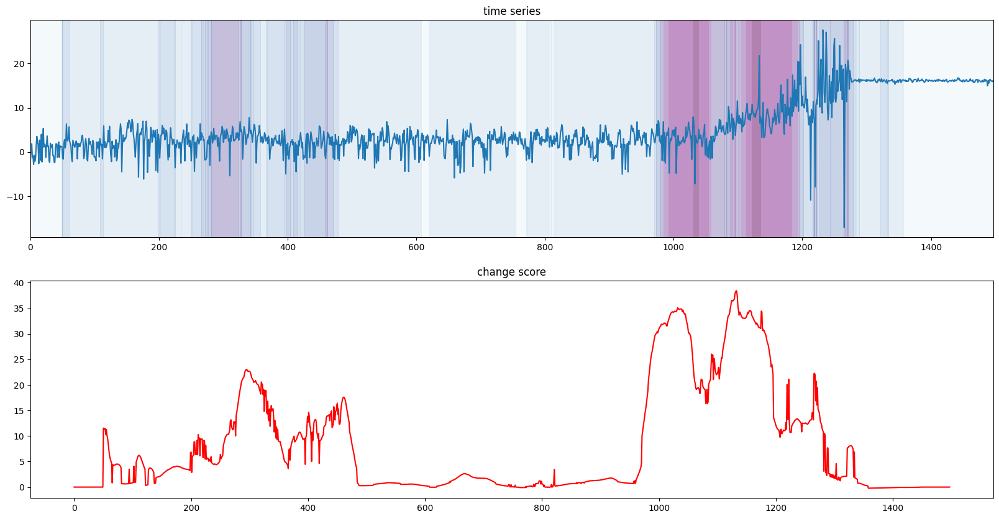

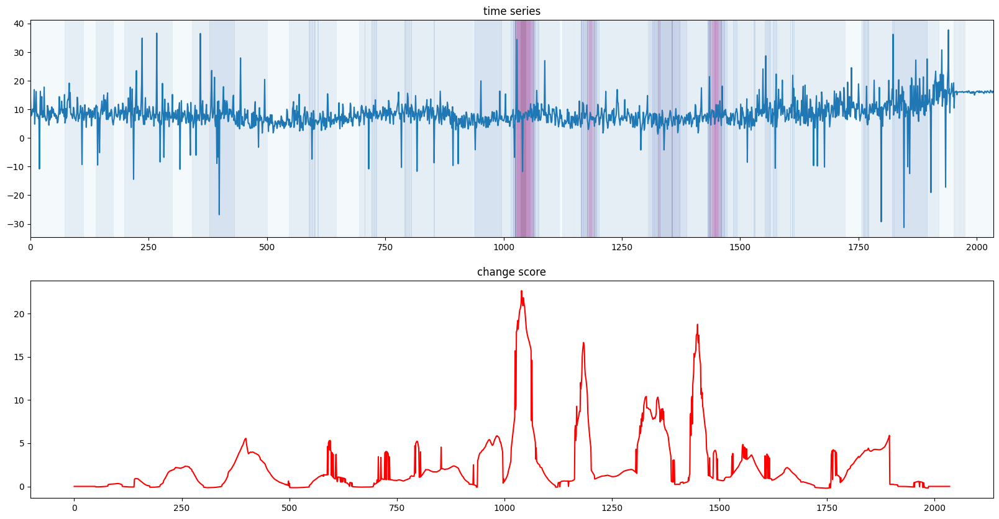

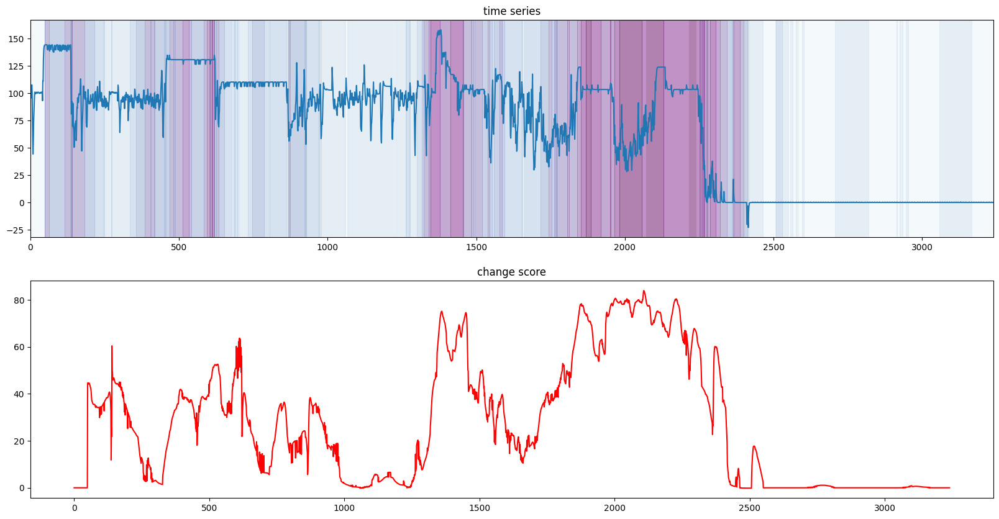

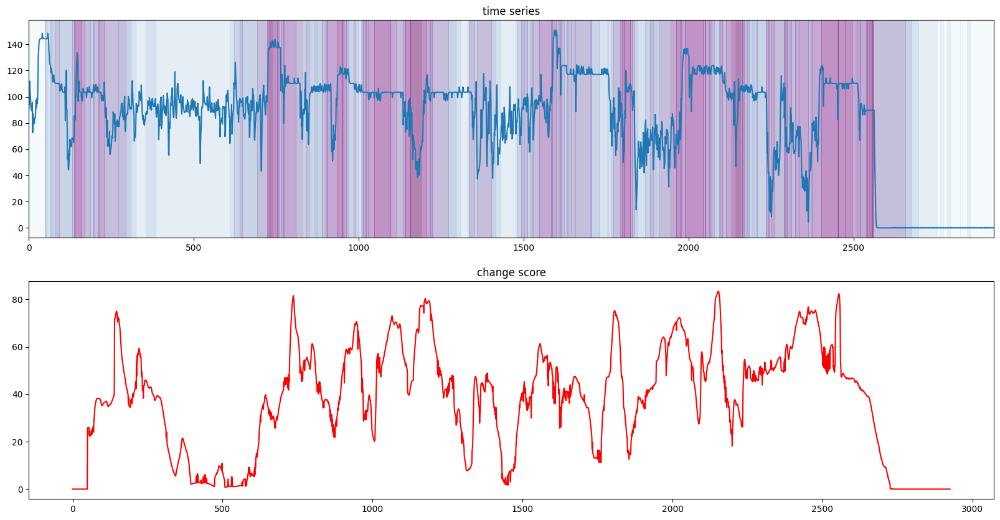

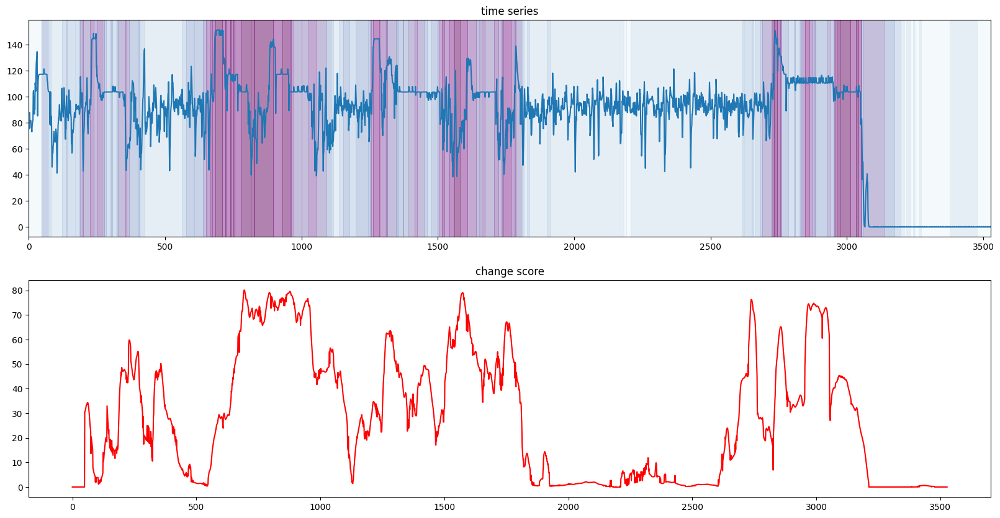

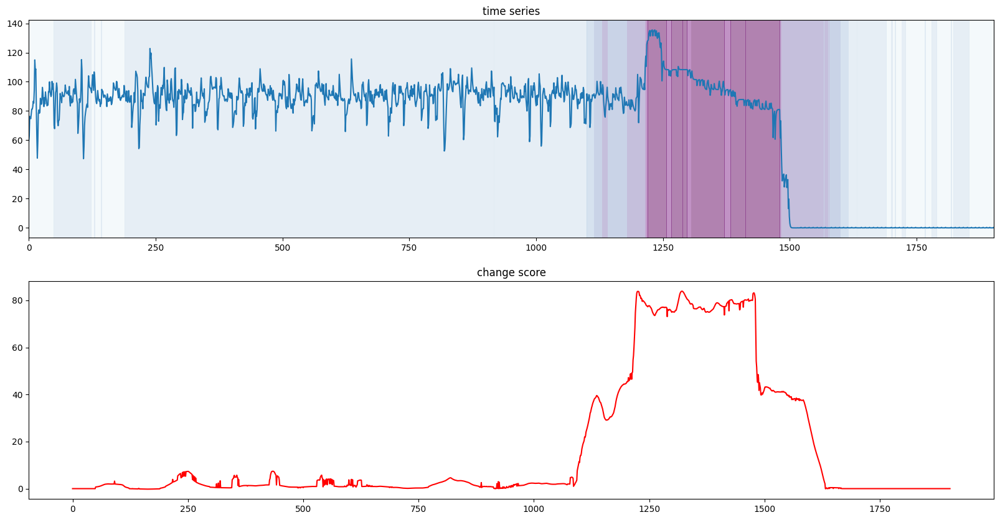

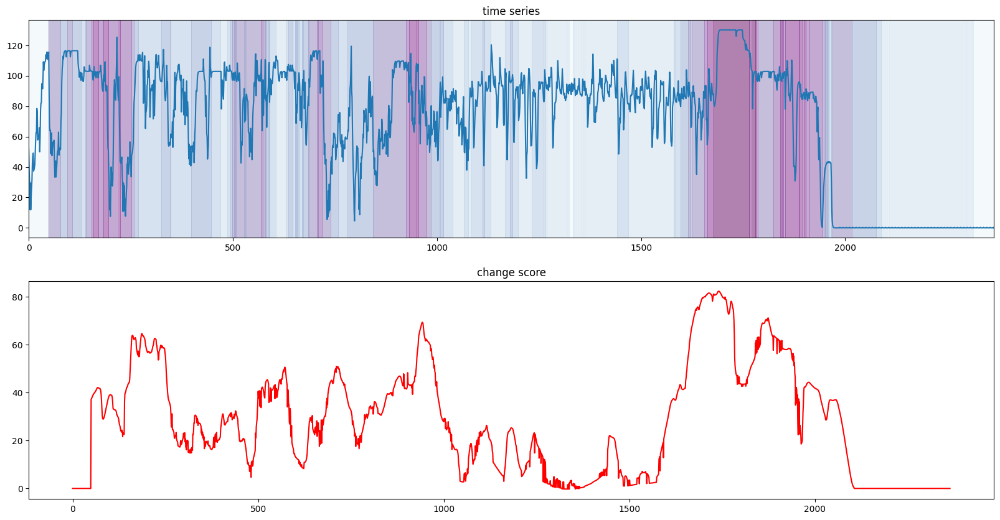

In [20]:
# compute change score using ClasP
# Torque
detector = RuLSIF(90)

# # # Torque
score1 = detector.transform(x1)
score2 = detector.transform(x2)
score3 = detector.transform(x3)
score4 = detector.transform(x4)
score5 = detector.transform(x5)

# WOB
score6 = detector.transform(x6)
score7 = detector.transform(x7)
score8 = detector.transform(x8)
score9 = detector.transform(x9)
score10 = detector.transform(x10)

# # Torque
plot_data_and_score(x1, y1, cuttoff, score1)
plot_data_and_score(x2, y2, cuttoff, score2)
plot_data_and_score(x3, y3, cuttoff, score3)
plot_data_and_score(x4, y4, cuttoff, score4)
plot_data_and_score(x5, y5, cuttoff, score5)

# WOB
plot_data_and_score(x6,y6, cuttoff,score6)
plot_data_and_score(x7,y7,cuttoff,score7)
plot_data_and_score(x8,y8,cuttoff,score8)
plot_data_and_score(x9,y9,cuttoff,score9)
plot_data_and_score(x10,y10,cuttoff,score10)

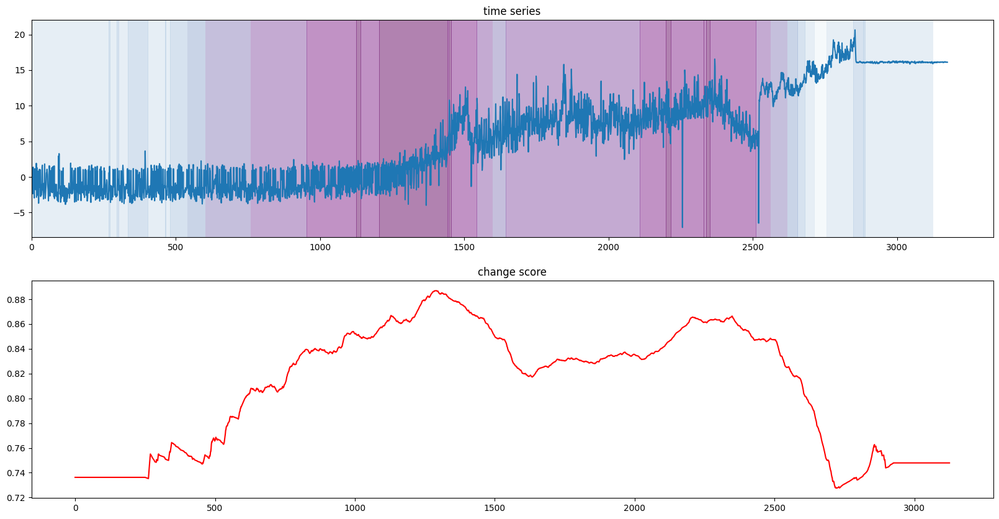

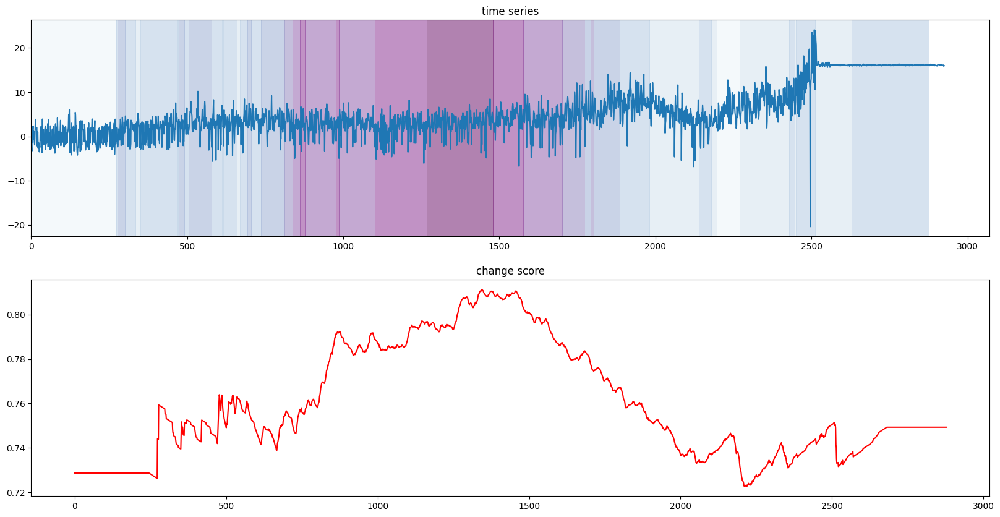

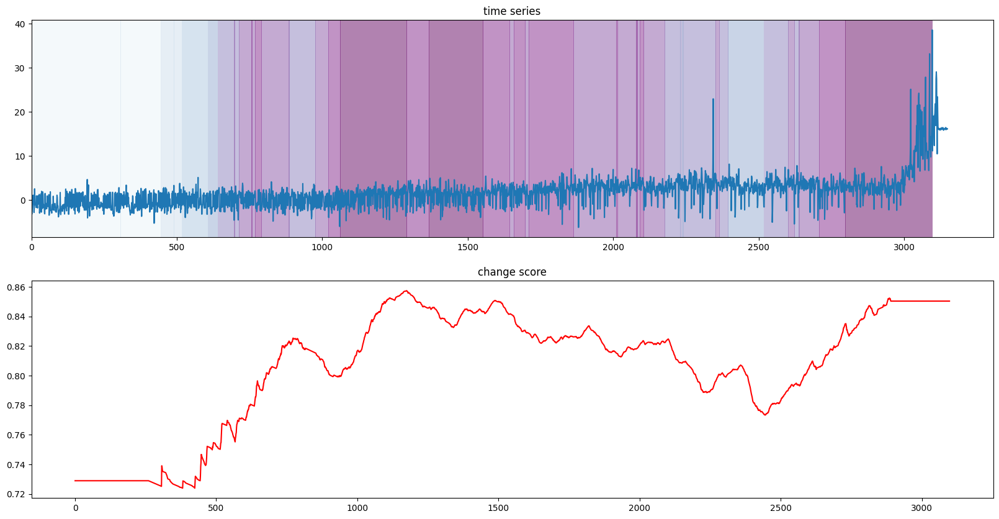

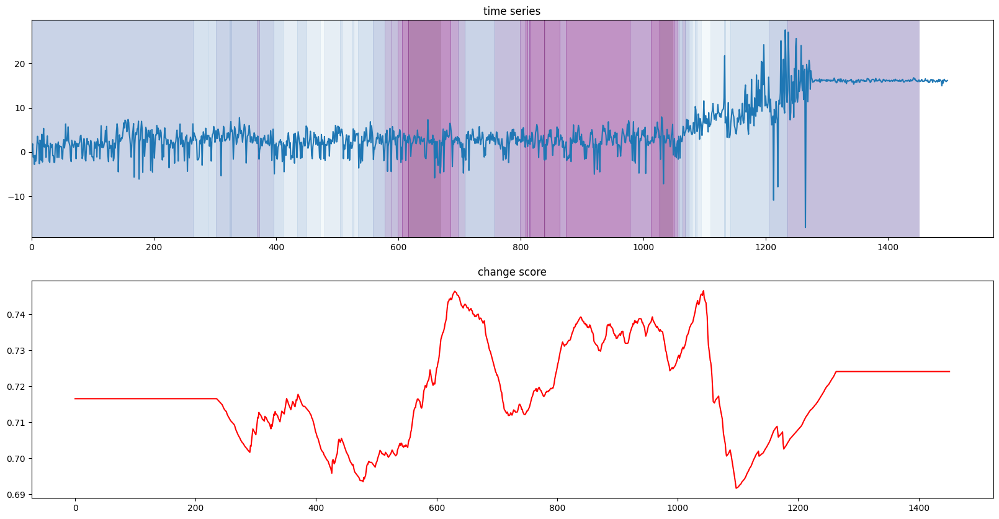

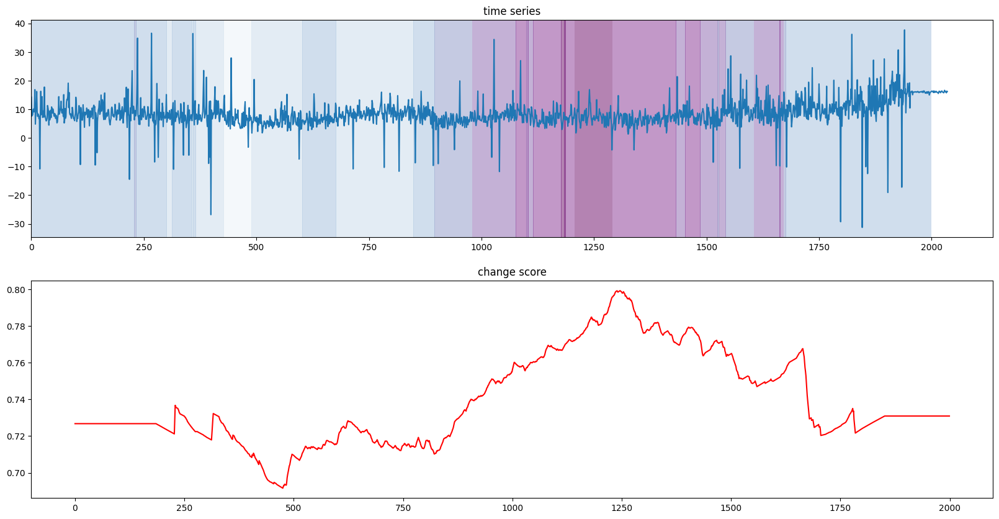

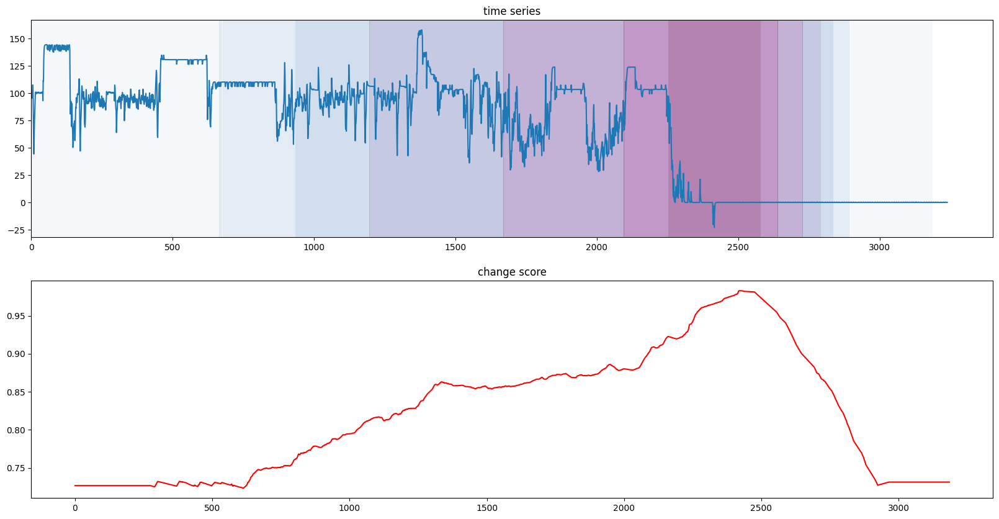

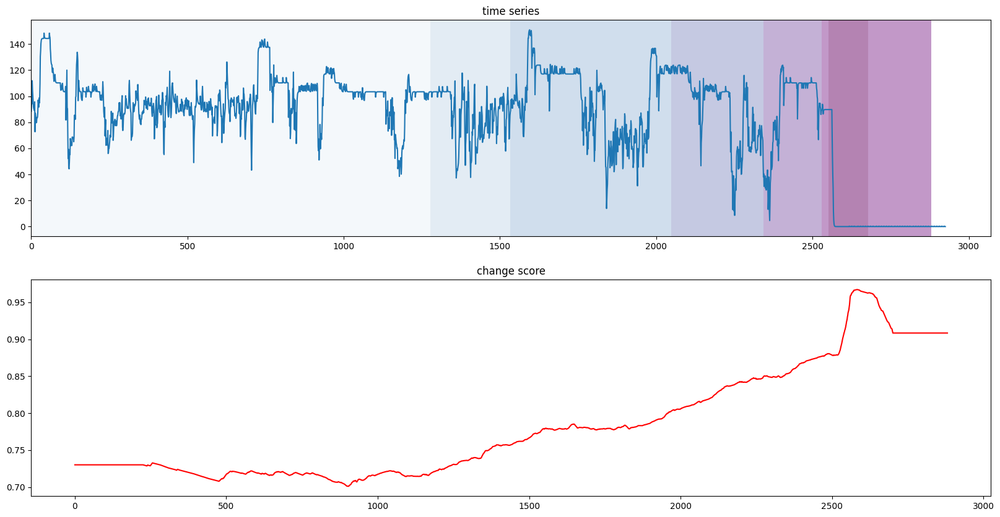

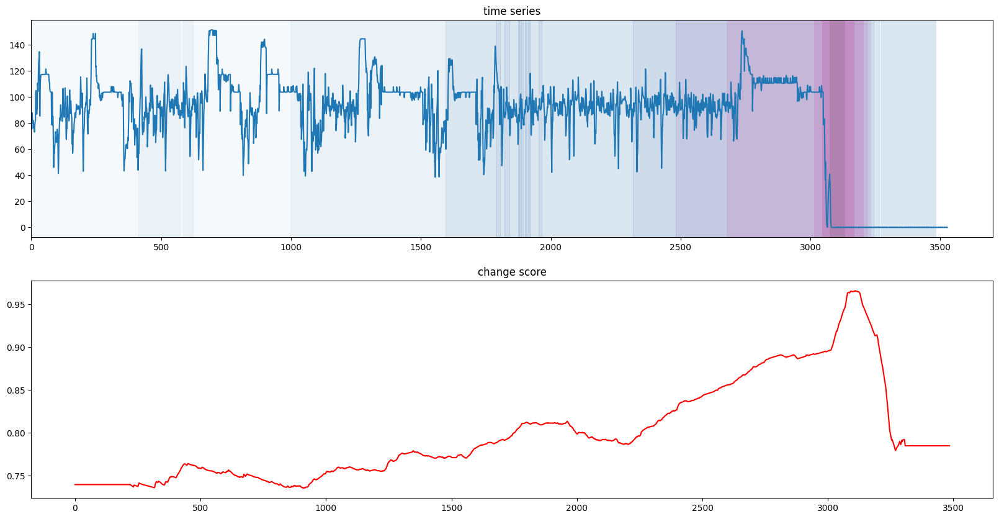

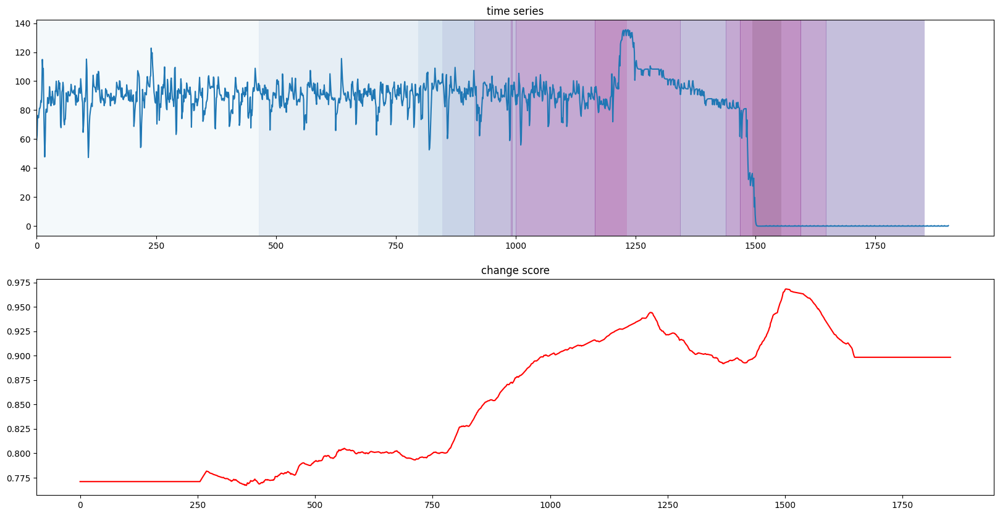

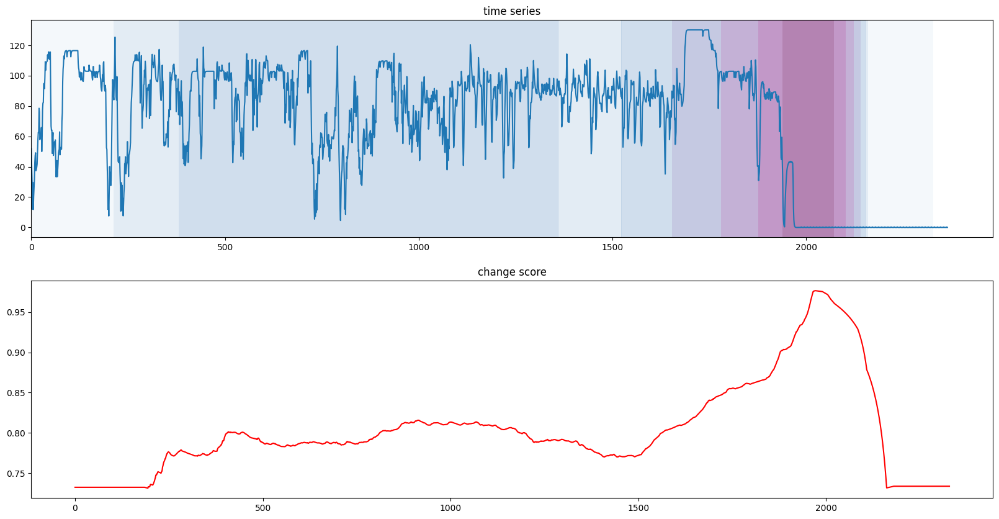

In [8]:
# compute change score using ClasP
# Torque
cuttoff = 0
detector = CLASP(90)

score1 = detector.transform(x1)
score2 = detector.transform(x2)
score3 = detector.transform(x3)
score4 = detector.transform(x4)
score5 = detector.transform(x5)

# WOB
score6 = detector.transform(x6)
score7 = detector.transform(x7)
score8 = detector.transform(x8)
score9 = detector.transform(x9)
score10 = detector.transform(x10)

# Torque
plot_data_and_score(x1, y1, cuttoff, score1)
plot_data_and_score(x2, y2, cuttoff, score2)
plot_data_and_score(x3, y3, cuttoff, score3)
plot_data_and_score(x4, y4, cuttoff, score4)
plot_data_and_score(x5, y5, cuttoff, score5)

# # WOB
plot_data_and_score(x6,y6, cuttoff,score6)
plot_data_and_score(x7,y7,cuttoff,score7)
plot_data_and_score(x8,y8,cuttoff,score8)
plot_data_and_score(x9,y9,cuttoff,score9)
plot_data_and_score(x10,y10,cuttoff,score10)